### Landslides

####  Susceptibility and Classification



Landslides can cause significant damage to property and loss of life, making their prediction an important area of research. This dataset provides information on various geological and environmental factors that can contribute to the occurrence of landslides. By training a machine learning model on this dataset, we can develop a tool that can predict the likelihood of a landslide occurring in a given location, based on the features provided. Such a tool could be used by governments, emergency responders, and other stakeholders to better prepare for and mitigate the impact of landslides, potentially saving lives and reducing the economic impact of these events.

This dataset is a subset of a much larger dataset from https://eartharxiv.org/repository/view/4719/. The purpose is to provide a benchmark dataset to compare machine learning algorithms in this field of study.

In [2]:
import pandas as pd 
import geopandas as gpd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import mapclassify
import contextily

sns.set_palette('flag')
sns.set_theme('notebook', font_scale=1.2)
sns.set_style('darkgrid')


In [4]:
file = gpd.read_file('dataset_benchmark/su_benchmark.gpkg')

In [5]:
file.head()

,id,slope_aver,slope_stdd,pcurv_aver,pcurv_stdd,tcurv_aver,tcurv_stdd,nthns_aver,nthns_stdd,easns_aver,...,SLTPPT_ave,SLTPPT_std,SNDPPT_ave,SNDPPT_std,Max_Distan,D_sqrt_A,presence1,presence2,area,geometry
0,7162,14.756897,10.059675,-5.467900e-06,0.001691,-0.000009,0.001847,-0.750997,0.358651,-0.176480,...,35.056614,1.451415,30.748344,1.439856,3523.226504,3.198805,1,1,1.214823e+06,"POLYGON ((797934.566 4808888.839, 797984.474 4..."
1,3364,13.572543,5.332797,1.495000e-07,0.001352,-0.000145,0.001631,-0.433173,0.360333,0.759061,...,33.573166,1.281193,29.975808,2.302816,970.824392,1.915489,0,0,2.572250e+05,"POLYGON ((795918.539 4810702.982, 795943.493 4..."
2,3362,12.155278,4.531705,-1.958755e-04,0.001733,0.000228,0.002158,-0.527324,0.434821,-0.508015,...,33.716126,0.848983,29.827985,1.112269,1262.190556,2.387983,0,0,2.797528e+05,"POLYGON ((795868.632 4810702.567, 795868.902 4..."
3,5551,19.402686,10.095957,-1.306920e-04,0.001710,0.000153,0.002021,-0.027153,0.539652,-0.823439,...,34.673561,1.941749,31.160783,1.689972,2761.340254,2.760478,1,1,1.002032e+06,"POLYGON ((798454.011 4809319.513, 798478.965 4..."
4,5184,9.383231,2.880513,6.500710e-05,0.001024,-0.000022,0.001511,-0.705909,0.363924,-0.259280,...,35.111878,0.659053,29.934158,0.939947,1233.389638,1.630984,1,0,5.726094e+05,"POLYGON ((790359.956 4810104.693, 790434.813 4..."




| Variable Name | Definition |
| --- | --- |
| unique_id  | Unique identifier for the slope unit. |
| slope_mean  | Mean slope steepness in degrees within the slope unit. Steeper slopes are generally more prone to landslides. |
| slope_std  | Standard deviation of slope within the slope unit. Greater variability in slope steepness could indicate a greater likelihood of instability. |
| pcurv_mean  | Mean planar curvature within the slope unit. Curvature can influence the direction of surface water flow and hence landslide initiation. |
| pcurv_std  | Standard deviation of planar curvature within the slope unit. |
| tcurv_mean  | Mean profile curvature within the slope unit. It is useful in identifying areas of terrain that are convex or concave in shape|
| tcurv_std  | Standard deviation of profile curvature within the slope unit. |
| north_mean  | Mean northness of the slope unit. Slopes that face north are generally cooler and wetter, which can influence the likelihood of landslides. |
| north_std  | Standard deviation of northness within the slope unit. |
| east_mean  | Mean eastness of the slope unit. |
| east_std  | Standard deviation of eastness within the slope unit. |
| elev_mean  | Mean elevation within the slope unit. Higher elevations may be more prone to landslides due to greater precipitation and steep terrain. |
| elev_std  | Standard deviation of elevation within the slope unit. |
| twi_mean  | Mean topographic wetness index within the slope unit. The wetness of the slope can influence the stability of the soil or rock. |
| twi_std  | Standard deviation of topographic wetness index within the slope unit. |
| bedrock_mean  | Mean depth to bedrock (<2.4 m) within the slope unit. Shallow bedrock can increase the likelihood of slope instability. |
| bedrock_std  | Standard deviation of depth to bedrock within the slope unit. |
| density_mean  | Mean bulk density within the slope unit. Soil with lower bulk density may be more prone to landslides. |
| density_std  | Standard deviation of bulk density within the slope unit. |
| clay_mean  | Mean weight % of clay particles within the slope unit. Soils with high clay content may be more prone to landslides due to decreased permeability and increased cohesion. |
| clay_std  | Standard deviation of weight % of clay particles within the slope unit. |
| sand_mean  | Mean weight % of sand particles within the slope unit. |
| sand_std  | Standard deviation of weight % of sand particles within the slope unit. |
| silt_mean  | Mean weight % of silt particles within the slope unit. |
| silt_std  | Standard deviation of weight % of silt particles within the slope unit. |
| max_distance  | Maximum distance within the slope unit, which could influence the likelihood of landslides. |
| dist_sqrt_area  | Maximum distance divided by the square root of the slope unit area, which can help account for the size of the slope unit. |
| landslide_presence1  | Binary landslide presence flag for the slope unit. |
| landslide_presence2  | Binary landslide presence flag for the slope unit based on multiple slip indexes. |
| area  | The area of the slope unit. |

##### Clarification

Importantly, the author made a distinction between two possible dependent variables:

- For 'presence1', a slope unit is labeled as having landslide presence (1) if it contains at least one point denoting a landslide, and labeled as not having landslide presence (0) if it does not contain any landslide points. So, the distinction is based solely on whether or not there are any landslide points within a slope unit.

- For 'presence2', a slope unit is labeled as having landslide presence (1) only if it contains one or more landslide points, but not more than one point. If a slope unit contains more than one landslide point, it is still labeled as having landslide presence (1), but if it contains no landslide points or just one landslide point, it is labeled as not having landslide presence (0). So, the distinction is based on the number of landslide points within a slope unit.

In [6]:
#rename columns to more meaningful names 
name_mapping = {
    'ID': 'id',
    'slope_aver': 'slope_mean',
    'slope_stdd': 'slope_std',
    'pcurv_aver': 'planar_curv_mean',
    'pcurv_stdd': 'planar_curv_std',
    'tcurv_aver': 'profile_curv_mean',
    'tcurv_stdd': 'profile_curv_std',
    'nthns_aver': 'north_mean',
    'nthns_stdd': 'north_std',
    'easns_aver': 'east_mean',
    'easns_stdd': 'east_std',
    'elev_avera': 'elev_mean',
    'elev_stdde': 'elev_std',
    'twi_average': 'topo_wetness_index_mean',
    'twi_stddev': 'topo_wetness_index_std',
    'BDRICM_ave': 'bedrock_depth_mean',
    'BDRICM_std': 'bedrock_depth_std',
    'BLDFIE_ave': 'bulk_dense_mean',
    'BLDFIE_std': 'bulk_dense_std',
    'CLYPPT_ave': 'clay_cont_mean',
    'CLYPPT_std': 'clay_cont_std',
    'SNDPPT_ave': 'sand_content_mean',
    'SNDPPT_std': 'sand_content_std',
    'SLTPPT_ave': 'silt_content_mean',
    'SLTPPT_std': 'silt_content_std',
    'Max_Distan': 'dist_max',
    'MD_sqrt_A': 'dist_max_sqrt_area',
    'presence1': 'presence1',
    'presence2': 'presence2',
    'area': 'slope_unit_area'
}

# Rename the columns in your Pandas DataFrame using the dictionary
df = file.rename(columns=name_mapping)
data = df.copy()

#### Data Integrity Check

In [7]:
data.shape

(7360, 31)

In [8]:
data.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 7360 entries, 0 to 7359
Data columns (total 31 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   id                      7360 non-null   int64   
 1   slope_mean              7360 non-null   float64 
 2   slope_std               7360 non-null   float64 
 3   planar_curv_mean        7360 non-null   float64 
 4   planar_curv_std         7360 non-null   float64 
 5   profile_curv_mean       7360 non-null   float64 
 6   profile_curv_std        7360 non-null   float64 
 7   north_mean              7360 non-null   float64 
 8   north_std               7360 non-null   float64 
 9   east_mean               7360 non-null   float64 
 10  east_std                7360 non-null   float64 
 11  elev_mean               7360 non-null   float64 
 12  elev_std                7360 non-null   float64 
 13  twi_averag              7360 non-null   float64 
 14  topo_wetness_ind

In [9]:
data.isnull().sum()

id                        0
slope_mean                0
slope_std                 0
planar_curv_mean          0
planar_curv_std           0
profile_curv_mean         0
profile_curv_std          0
north_mean                0
north_std                 0
east_mean                 0
east_std                  0
elev_mean                 0
elev_std                  0
twi_averag                0
topo_wetness_index_std    0
bedrock_depth_mean        0
bedrock_depth_std         0
bulk_dense_mean           0
bulk_dense_std            0
clay_cont_mean            0
clay_cont_std             0
silt_content_mean         0
silt_content_std          0
sand_content_mean         0
sand_content_std          0
dist_max                  0
D_sqrt_A                  0
presence1                 0
presence2                 0
slope_unit_area           0
geometry                  0
dtype: int64

We do not have any Null values in this dataset. Next we need to check for outliers.

In [10]:
data.describe()

,id,slope_mean,slope_std,planar_curv_mean,planar_curv_std,profile_curv_mean,profile_curv_std,north_mean,north_std,east_mean,...,clay_cont_std,silt_content_mean,silt_content_std,sand_content_mean,sand_content_std,dist_max,D_sqrt_A,presence1,presence2,slope_unit_area
count,7360.000000,7360.000000,7360.000000,7360.000000,7360.000000,7360.000000,7360.000000,7360.000000,7360.000000,7360.000000,...,7360.000000,7360.000000,7360.000000,7360.000000,7360.000000,7360.000000,7360.000000,7360.000000,7360.00000,7.360000e+03
mean,3836.650679,9.703835,4.311448,-0.000085,0.001360,0.000086,0.001274,-0.021343,0.383309,-0.034500,...,1.090827,34.381861,0.885604,29.844549,1.180754,1383.538950,1.980637,0.488315,0.30856,5.564224e+05
std,2234.131260,4.725057,2.027385,0.000202,0.000577,0.000190,0.000500,0.558577,0.131820,0.592523,...,0.645704,2.373090,0.466765,2.881624,0.618447,748.187158,0.411759,0.499897,0.46193,5.655051e+05
min,1.000000,0.585250,0.311342,-0.001600,0.000222,-0.000902,0.000167,-0.975858,0.027416,-0.974449,...,0.055780,29.196455,0.043586,21.812487,0.097376,425.000000,1.284048,0.000000,0.00000,1.006890e+05
25%,1885.750000,6.166136,2.789519,-0.000167,0.000981,-0.000017,0.000905,-0.540703,0.289963,-0.604623,...,0.634752,32.597756,0.572139,27.723420,0.731741,863.133825,1.673982,0.000000,0.00000,2.227650e+05
50%,3835.500000,9.023672,3.977327,-0.000062,0.001273,0.000069,0.001223,-0.038519,0.379232,-0.063105,...,0.903737,33.881857,0.775196,29.656008,1.030781,1185.326959,1.904725,0.000000,0.00000,3.735919e+05
75%,5763.250000,12.412594,5.473755,0.000022,0.001632,0.000169,0.001585,0.496813,0.472818,0.539570,...,1.353226,35.917081,1.070416,31.923873,1.491766,1680.076261,2.199240,1.000000,1.00000,6.728322e+05
max,7732.000000,30.437743,13.732353,0.001124,0.007438,0.001351,0.004023,0.969405,0.940096,0.970188,...,5.153335,42.945566,4.471211,39.789163,4.408842,7106.335202,4.236220,1.000000,1.00000,8.053675e+06


In [9]:
print(data.crs)
data = data.to_crs(epsg=4326)

data.crs

PROJCS["unknown",GEOGCS["wgs84",DATUM["WGS_1984",SPHEROID["WGS_1984",6378137,298.257223563]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",9],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]]


<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

The data seems reliable. There are no outliers distinguishable in the dataset. We will look at this further in the future. 

### EDA

In [10]:
data[['presence1', 'presence2']].value_counts()

presence1  presence2
0          0            3766
1          1            2271
           0            1323
dtype: int64

<Figure size 2000x2000 with 0 Axes>

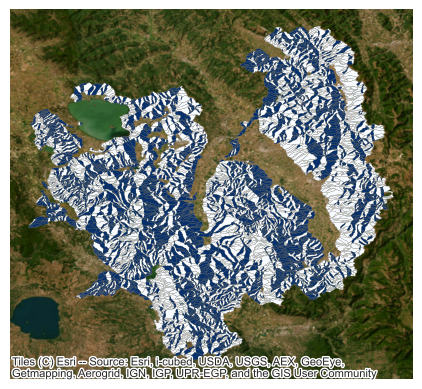

In [11]:
# plot where landslides have occurred
plt.figure(figsize=(20,20))
ax = data.plot(column = 'east_mean', cmap = 'Blues', edgecolor = 'grey', linewidth=.1, legend = False,\
               legend_kwds={'labels': ['No Landslide', 'Landslide'], 'loc': 2},scheme="quantiles", k=2)
ax.set_axis_off()
# add background
contextily.add_basemap(ax=ax, crs=data.crs.to_string(), source= contextily.providers.Esri.WorldImagery)

plt.show()


<Figure size 2000x2000 with 0 Axes>

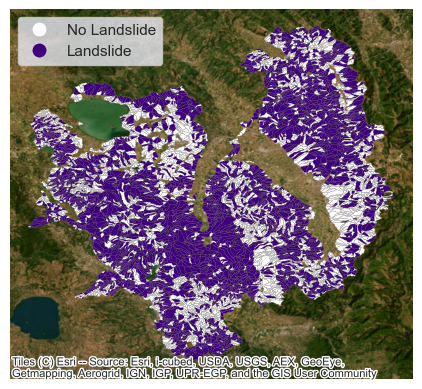

In [12]:
# plot where landslides have occurred
plt.figure(figsize=(20,20))
ax = data.plot(column = 'presence1', cmap = 'Purples', edgecolor = 'grey', linewidth=.1, legend = True,\
               legend_kwds={'labels': ['No Landslide', 'Landslide'], 'loc': 2},scheme="quantiles", k=2)
ax.set_axis_off()
# add background
contextily.add_basemap(ax=ax, crs=data.crs.to_string(), source= contextily.providers.Esri.WorldImagery)

plt.show()

The map shows a highly susceptible location toward the middle of the plot. Most of the action is also toward the edge of the given polygons. We can plot some of the statistics to see if they match, but first we can look at the distributions of the given features to see if some may be more telling than others.

Text(0, 0.5, 'Landslide')

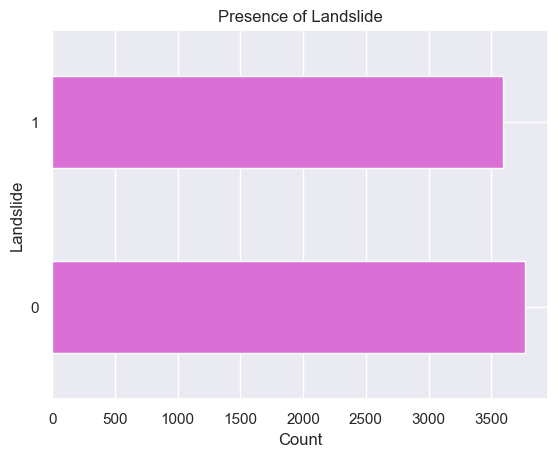

In [13]:
data['presence1'].value_counts().plot(kind = 'barh', color = 'orchid')
plt.title('Presence of Landslide')
plt.xlabel('Count')
plt.ylabel('Landslide')

In [14]:
data.head(1)

,id,slope_mean,slope_std,planar_curv_mean,planar_curv_std,profile_curv_mean,profile_curv_std,north_mean,north_std,east_mean,...,silt_content_mean,silt_content_std,sand_content_mean,sand_content_std,dist_max,D_sqrt_A,presence1,presence2,slope_unit_area,geometry
0,7162,14.756897,10.059675,-0.000005,0.001691,-0.000009,0.001847,-0.750997,0.358651,-0.17648,...,35.056614,1.451415,30.748344,1.439856,3523.226504,3.198805,1,1,1.214823e+06,"POLYGON ((12.67749 43.37373, 12.67810 43.37371..."


In [15]:
# get features I want to compare in a list to iterate through
feature = data.columns.to_list()[1:27]

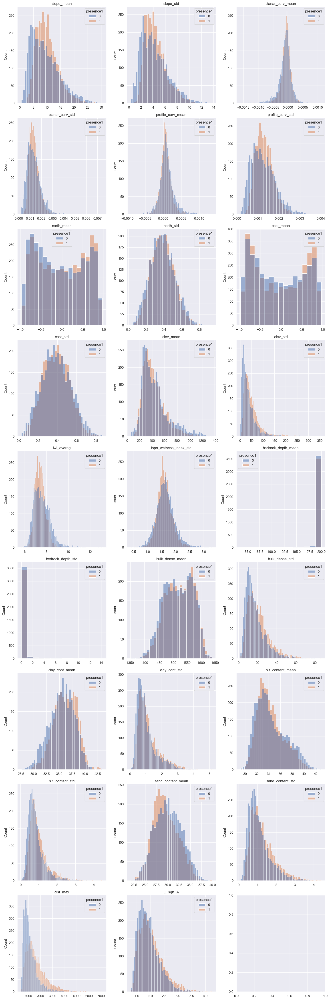

In [16]:
# Create the grid of plots
num_rows = (len(feature) + 2) // 3 # calculate the number of rows needed
fig, axes = plt.subplots(num_rows, 3, figsize=(15, 5*num_rows))

# Loop over the features and add a histogram plot for each feature to the grid
for i, feat in enumerate(feature):
    row = i // 3
    col = i % 3
    ax = axes[row, col]
    sns.histplot(data=data, x=feat, hue='presence1', ax=ax, fill=True)
    ax.set_title(feat)
    ax.set_xlabel("")

    
plt.tight_layout() # adjust the spacing between subplots
plt.show()

#### Notes:

They’re a couple of things to note from the graph above that could be indicators of a landslide.

1. The slope, not surprisingly, is the biggest indicator of a landslide. The larger the slope or the large the deviation in the slope the greater the risk.
2. The standard deviation’s of characteristics such as planar curve and profile curve are distinct in their representation of landslide susceptibility. 
3.  Change is the largest determining factor in landslides.


To take this one step further we look at the 5 most distinguishable characteristics on the map to get a better idea of possible polynomial effects.


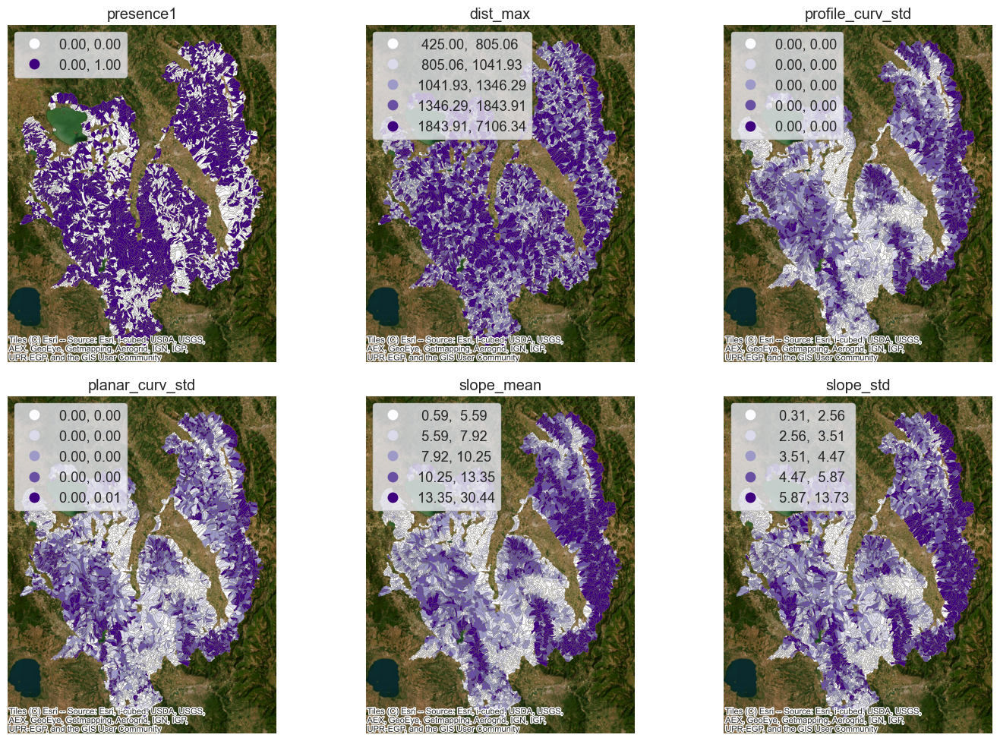

In [66]:
noticable = ['presence1', 'dist_max', 'profile_curv_std', 'planar_curv_std', 'slope_mean', 'slope_std']

# Create the grid of plots
num_rows = 2
fig, axes = plt.subplots(num_rows, 3, figsize=(15, 10))

# Loop over the features and add a histogram plot for each feature to the grid
for i, feat in enumerate(noticable):
    row = i // 3
    col = i % 3
    ax = axes[row, col]
    data.plot(ax=ax, column=feat, cmap='Purples', edgecolor='grey', linewidth=.1, legend=True,\
               legend_kwds={'loc': 2}, scheme="quantiles", k=5)
    ax.set_title(feat)
    contextily.add_basemap(ax=ax, crs=data.crs.to_string(), source= contextily.providers.Esri.WorldImagery)
    ax.set_axis_off()


    
plt.tight_layout() # adjust the spacing between subplots
plt.show()


/Users/laffer/Desktop/IoD/iod_env/lib/python3.11/site-packages/mapclassify/classifiers.py:255: UserWarning: Not enough unique values in array to form 5 classes. Setting k to 1.
  warnings.warn(
/Users/laffer/Desktop/IoD/iod_env/lib/python3.11/site-packages/mapclassify/classifiers.py:255: UserWarning: Not enough unique values in array to form 5 classes. Setting k to 2.
  warnings.warn(


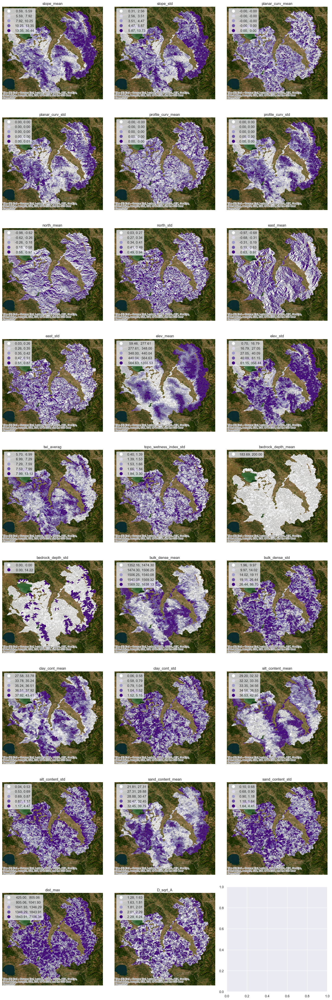

In [18]:
noticable = ['presence1', 'dist_max', 'profile_curv_std', 'planar_curv_std', 'slope_mean', 'slope_std']

# Create the grid of plots
num_rows = (len(feature)+2)//3 
fig, axes = plt.subplots(num_rows, 3, figsize=(15, 5*num_rows))

# Loop over the features and add a histogram plot for each feature to the grid
for i, feat in enumerate(feature):
    row = i // 3
    col = i % 3
    ax = axes[row, col]
    data.plot(ax=ax, column=feat, cmap='Purples', edgecolor='grey', linewidth=.1, legend=True,\
               legend_kwds={'loc': 2}, scheme="quantiles", k=5)
    ax.set_title(feat)
    contextily.add_basemap(ax=ax, crs=data.crs.to_string(), source= contextily.providers.Esri.WorldImagery)
    ax.set_axis_off()


    
plt.tight_layout() # adjust the spacing between subplots
plt.show()


#### Notes

In addition to the features that were noted earlier, the maps point to other important factors in predicting slope.

1. Sand and silt are key indicators. They are are negatively collinear. If there is less sand there is likely more silt. The lower the sand and the higher the silt the more susceptible to earthquakes it could be.
2. Higher elevation is less susceptible to landslides. Possibly because there isn't as much pressure on profile at higher elevations.

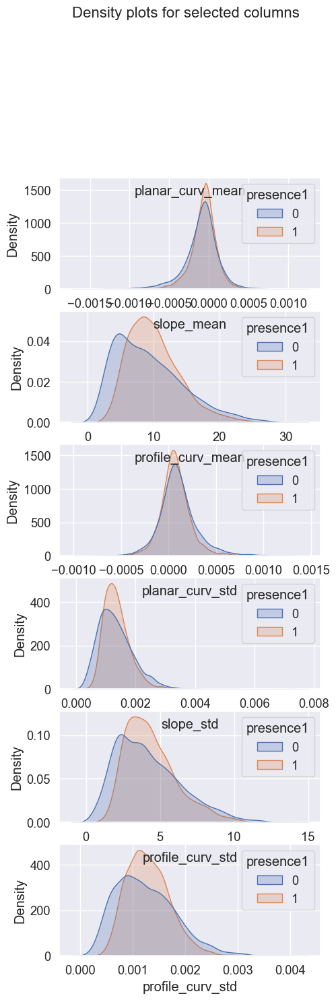

In [71]:
columns = ['planar_curv_mean', 'slope_mean', 'profile_curv_mean','planar_curv_std', 'slope_std', 'profile_curv_std']

fig, axs = plt.subplots(len(columns), 1, figsize=(5, 15))

# Plot density plots for each column
for i, col in enumerate(columns):
    sns.kdeplot(data=data, x=col, hue='presence1', ax=axs[i], fill=True)
    axs[i].set_xlabel(col)
    axs[i].set_title(col, y = .8)

# Set title for the figure
fig.suptitle('Density plots for selected columns', fontsize=16, y=1.05)

# Show the plot
plt.show()


The pairplot indicates a possible interaction effect between most variable and the planar curve standard deviation. 

<Axes: >

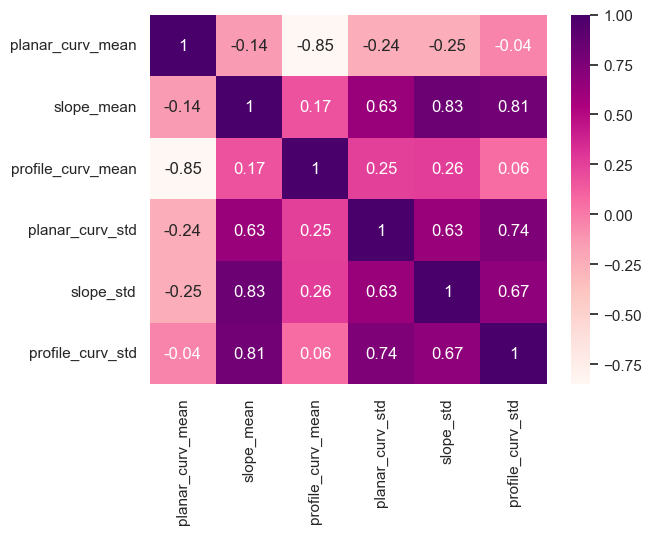

In [20]:
corr = data[columns[:6]].corr().round(2)
sns.heatmap(corr, annot=True, cmap = 'RdPu')

#### Spatial Autocorrelation

There seems to be a correlation between the location's of having a landslide and not having a landslide. We will check the by calculating moran's I. To do this we define a Gaussian Kernal based weight by distance to the presence1 feature.

In [21]:
import esda
from libpysal import weights

In [22]:
data = data.to_crs(epsg=3857)

In [23]:
# create a weights matrix and calculate the spatial lag
W = weights.Kernel.from_dataframe(data,geom_col= 'geometry', function='gaussian')
W.transform = 'B'
# create the spatial lag by calculating the sum of the binary variable in the NN
data["w_presence1"] = weights.lag_categorical(W, np.ravel(data['presence1']))


/Users/laffer/Desktop/IoD/iod_env/lib/python3.11/site-packages/libpysal/weights/weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 2 disconnected components.
  warnings.warn(message)


In [24]:
data['w_presence1'].value_counts()

0    3911
1    3449
Name: w_presence1, dtype: int64

In [25]:
moran = esda.Moran(data['presence1'], W, transformation='R')

print("Global Moran's I:", moran.I)

Global Moran's I: 0.26070884415997597


Global Moran's I indicates that there is positive spatial autocorrelation in the data, meaning that areas with similar values of the presence of landslides tend to cluster together in space. This could be due to factors such as geological or topographical features, which may affect the likelihood of landslides occurring in certain areas!

We ca

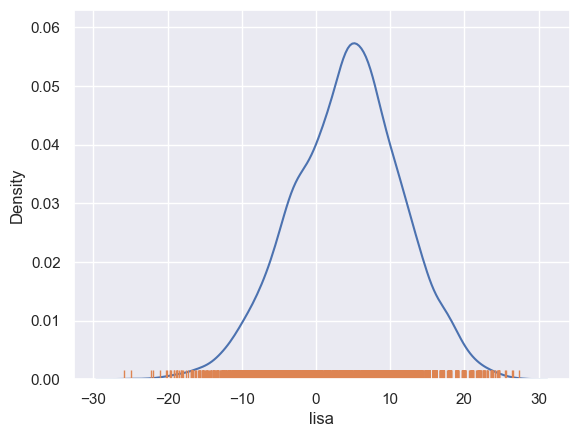

In [26]:
# Plot LISA map on first axis
lisa = esda.Moran_Local(data['presence1'], W, transformation='B')
data['lisa'] = lisa.Is



# Draw KDE line
ax = sns.kdeplot(data['lisa'])
# Add one small bar (rug) for each observation
# along horizontal axis
sns.rugplot(data['lisa'], ax=ax);

Plotting the local moran values is slightly surprise. Most of the values show a high autocorrelation meaning the locations with a presence of of landslide are located close to other locations that a landslide was present. The surprise is the number of landslide next to locations that didn't have a landslide.

/Users/laffer/Desktop/IoD/iod_env/lib/python3.11/site-packages/mapclassify/classifiers.py:255: UserWarning: Not enough unique values in array to form 5 classes. Setting k to 4.
  warnings.warn(


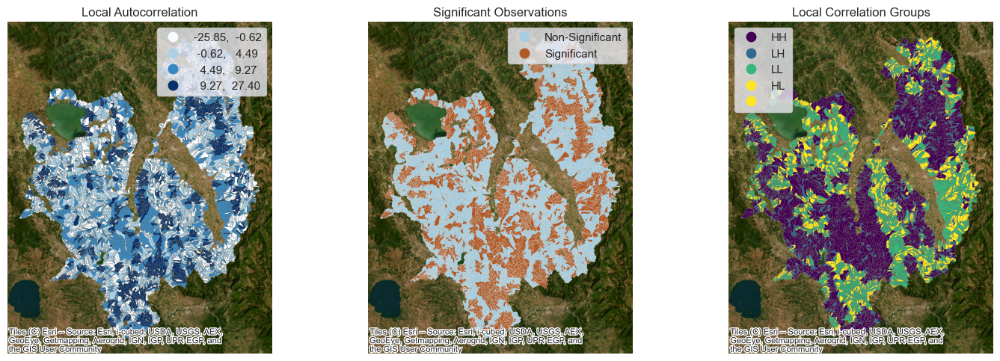

<Figure size 640x480 with 0 Axes>

In [27]:
fg, axs = plt.subplots(1, 3, figsize=(15, 5))

axs[0] = data.plot(column='lisa', cmap='Blues',edgecolor='gray', scheme='quantiles',linewidth=.1,\
                   k=4, legend=True, ax=axs[0])
contextily.add_basemap(ax=axs[0], crs=data.crs.to_string(), source=contextily.providers.Esri.WorldImagery)
axs[0].set_axis_off()
axs[0].set_title('Local Autocorrelation')

# Second Plot ---------------------------------------
# Plot significant/non-significant observations on second axis
labels = pd.Series(
    1 * (lisa.p_sim < 0.05),  # Assign 1 if significant, 0 otherwise
    index=data.index  # Use the index in the original data
).map({1: "Significant", 0: "Non-Significant"})

data.plot(column=labels, categorical=True, k=2, cmap="Paired",
          linewidth=0.1, edgecolor="white", legend=True, ax=axs[1])

axs[1].set_axis_off()
axs[1].set_title('Significant Observations')
contextily.add_basemap(ax=axs[1], crs=data.crs.to_string(), source=contextily.providers.Esri.WorldImagery)

# Third plot-------------------------------------

# lisa_q is the quantile the observation belongs in hh, ll, hl, lh
data['lisa_q'] =lisa.q

data['lisa_q'].value_counts()

axs[2] = data.plot(ax = axs[2], column = 'lisa_q', edgecolor = 'grey', linewidth=.1, legend = True,\
              legend_kwds={'loc': 2, 'labels': ['HH','LH', 'LL', 'HL', '']}, scheme="quantiles", k=5)
axs[2].set_axis_off()
axs[2].set_title('Local Correlation Groups')
contextily.add_basemap(ax=axs[2], crs=data.crs.to_string(), source=contextily.providers.Esri.WorldImagery)


plt.tight_layout()
plt.show()
plt.savefig('Autocorrelation_Map.png', dpi=300, bbox_inches='tight')

The choropleth does a much better job an point out positive autocorrelation. On the left, the darker the blue the more alike the surroundings are. The plot on the left shows the significance level for that particular area. Again, it is important to note that the dark blue does not indicate landslides. It indicates the the locality of it being a landslide or not being a landslide.

The p_sim values, in the middle plot, are generated by running a permutation test as part of the Local Moran's I analysis. The permutation test is used to assess the statistical significance of the local Moran's I values calculated for each observation in the dataset.

The plot on the right provides a more insightful understanding of the correlations between local autocorrelation of landslides in our area. The terms HH and LL represent areas with high autocorrelation density, while the opposite is true for LH and HL, which denote areas with negative autocorrelation, meaning the surrounding areas are dissimilar. It is essential to refer to the statistical significance reports in the middle graph.

#### Ground Content

we can move on to investigate the materials present in the ground as another possible factor in predicting landslides.

The original dataframe contains information on three types of materials: sand, silt, and clay. By examining these variables in relation to the occurrence of landslides, the analysis may gain a better understanding of the relationship between material type and landslide occurrence, and potentially improve its ability to predict future landslides.

In [28]:
#Sand, silt and bedrock
texture = ['id','clay_cont_mean', 'clay_cont_std',
       'silt_content_mean', 'silt_content_std', 'sand_content_mean',
       'sand_content_std', 'presence1']

txt = data[texture]
txt.head()

,id,clay_cont_mean,clay_cont_std,silt_content_mean,silt_content_std,sand_content_mean,sand_content_std,presence1
0,7162,34.416423,1.824771,35.056614,1.451415,30.748344,1.439856,1
1,3364,36.570848,1.563676,33.573166,1.281193,29.975808,2.302816,0
2,3362,36.275055,0.712706,33.716126,0.848983,29.827985,1.112269,0
3,5551,34.222595,2.183813,34.673561,1.941749,31.160783,1.689972,1
4,5184,35.225314,1.018709,35.111878,0.659053,29.934158,0.939947,1


In [29]:
#closer look at the features interacting with each other
txt.groupby('presence1')[texture].describe().T.head(40)



presence1                          0            1
id                count  3766.000000  3594.000000
                  mean   1948.160382  5815.519477
                  std    1138.313898  1100.045543
                  min       1.000000  3925.000000
                  25%     962.250000  4863.250000
                  50%    1929.500000  5808.500000
                  75%    2937.750000  6767.750000
                  max    3924.000000  7732.000000
clay_cont_mean    count  3766.000000  3594.000000
                  mean     35.443156    36.144910
                  std       2.397420     2.241372
                  min      27.584092    29.005875
                  25%      33.795621    34.579445
                  50%      35.593658    36.212218
                  75%      37.217842    37.864879
                  max      43.069492    43.411822
clay_cont_std     count  3766.000000  3594.000000
                  mean      1.014883     1.170405
                  std       0.616505     0.665800
                  min       0.055780     0.064067
                  25%       0.584799     0.690438
                  50%       0.838123     0.981523
                  75%       1.242738     1.472232
                  max       4.092997     5.153335
silt_content_mean count  3766.000000  3594.000000
                  mean     34.427378    34.334166
                  std       2.532885     2.192532
                  min      29.196455    29.337113
                  25%      32.455076    32.706881
                  50%      33.846210    33.903161
                  75%      36.185432    35.635784
                  max      42.945566    41.519160
silt_content_std  count  3766.000000  3594.000000
                  mean      0.819787     0.954571
                  std       0.437150     0.486499
                  min       0.043586     0.064616
                  25%       0.526309     0.626947
                  50%       0.721382     0.832173
                  75%       0.981529     1.145088
                  max       3.629176     4.471211

We will performed independent t-tests to compare the mean of the means texture values between the presence and absence groups for each particle size group (sand, silt, and clay). The null hypothesis is that there is no difference in mean particle values between the two groups, while the alternative hypothesis is that the mean texture values are different between the two groups. A significance level of alpha=0.05 is used.

In [30]:
from scipy import stats
subjects = ['clay_cont_mean', 'silt_content_mean', 'sand_content_mean']

#define a function to split and run the test for each group
def run_test(col):   
    test_subj = data[[col, 'presence1']]
    neg = test_subj[test_subj['presence1']==0][col]
    pos = test_subj[test_subj['presence1']==1][col]
    t, p = stats.ttest_ind(neg, pos, equal_var=False, random_state=123)
    print(f'The P-value for {col} is {p}')
    
    

In [31]:
[run_test(col) for col in subjects];

The P-value for clay_cont_mean is 4.283458099880641e-38
The P-value for silt_content_mean is 0.09101738476027481
The P-value for sand_content_mean is 8.617978927607656e-20


The results of the t-tests for each of the three particle size groups (clay, silt, and sand) suggest that there is a statistically significant difference in mean values between samples where the species is present versus absent for both clay and sand. 
- Clay: The p-value is extremely low, indicating that it is highly unlikely that the difference in mean values between the presence and absence groups is due to chance alone. 
- Sand: The p-value is also quite low, though not as low as for clay. 
- Silt: The p-value is higher than the commonly used threshold of 0.05, indicating that there is not a statistically significant difference in mean silt content between the presence and absence groups.

Based on the summary statistics above I am very surprised by the significance of the relationship. We can visualize this better with some box plots.

<Axes: xlabel='value', ylabel='variable'>

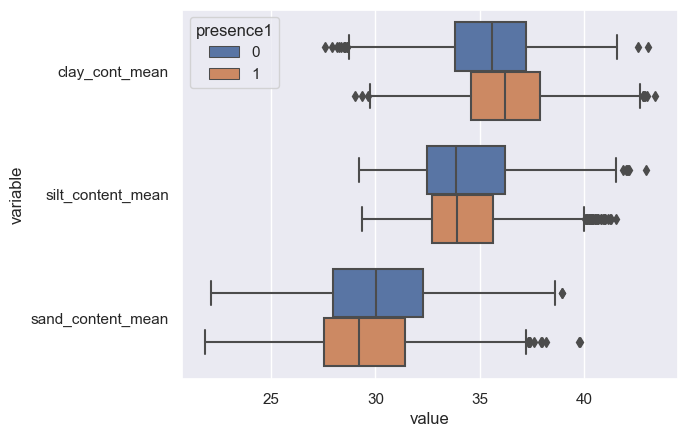

In [32]:
subjects = ['clay_cont_mean', 'silt_content_mean', 'sand_content_mean', 'presence1']
box = data[subjects].melt(id_vars=['presence1'],value_vars=['clay_cont_mean', 'silt_content_mean', 'sand_content_mean'])

sns.boxplot(data=box,x = 'value', y = 'variable', hue = 'presence1')



For our significant varibale of clay and sand we can say it is likely that the landslide are more prevalent when there is less sand and more clay content. 

We can taker this one step further and check out an interaction between the two.

/var/folders/nf/vsypdynx6l5bkkj3kvftrpz80000gn/T/ipykernel_54030/1612988750.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  clay_sand['poly'] = clay_sand['clay_cont_mean'] * clay_sand['sand_content_mean']


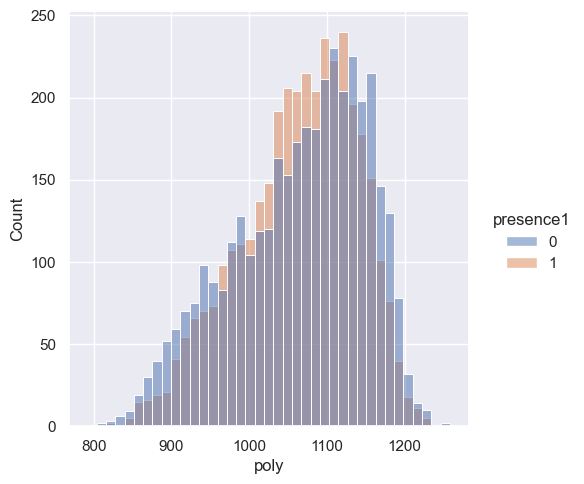

In [33]:
subjects = ['clay_cont_mean', 'sand_content_mean', 'presence1']

clay_sand = data[subjects]
clay_sand['poly'] = clay_sand['clay_cont_mean'] * clay_sand['sand_content_mean']

sns.displot(x = 'poly', data = clay_sand,  hue = 'presence1' )


This isn't the polynomial effect I was hoping for. We ended with the same understanding that we did before. This is because lower sand content and higher clay content is more likely to cause a landslide. 

To combat this problem we will engineer a custom polynomial effect based on the content quantile for each.

In [34]:
labels = [1,2,3,4,5]
sand_labels=[5,4,3,2,1]

txt['clay_quantile'] = pd.qcut(txt['clay_cont_mean'],q = 5, labels=labels) #high clay -> high quantile
txt['sand_quantile'] = pd.qcut(txt['sand_content_mean'],q = 5, labels=sand_labels) #low sand -> high quantile

# polynomial effect between sand and clay
txt['poly_sand_clay'] = txt['clay_quantile'].astype('int16') * txt['sand_quantile'].astype('int16')
txt.head()

/var/folders/nf/vsypdynx6l5bkkj3kvftrpz80000gn/T/ipykernel_54030/400135606.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  txt['clay_quantile'] = pd.qcut(txt['clay_cont_mean'],q = 5, labels=labels) #high clay -> high quantile
/var/folders/nf/vsypdynx6l5bkkj3kvftrpz80000gn/T/ipykernel_54030/400135606.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  txt['sand_quantile'] = pd.qcut(txt['sand_content_mean'],q = 5, labels=sand_labels) #low sand -> high quantile
/var/folders/nf/vsypdynx6l5bkkj3kvftrpz80000g

,id,clay_cont_mean,clay_cont_std,silt_content_mean,silt_content_std,sand_content_mean,sand_content_std,presence1,clay_quantile,sand_quantile,poly_sand_clay
0,7162,34.416423,1.824771,35.056614,1.451415,30.748344,1.439856,1,2,2,4
1,3364,36.570848,1.563676,33.573166,1.281193,29.975808,2.302816,0,4,3,12
2,3362,36.275055,0.712706,33.716126,0.848983,29.827985,1.112269,0,3,3,9
3,5551,34.222595,2.183813,34.673561,1.941749,31.160783,1.689972,1,2,2,4
4,5184,35.225314,1.018709,35.111878,0.659053,29.934158,0.939947,1,2,3,6


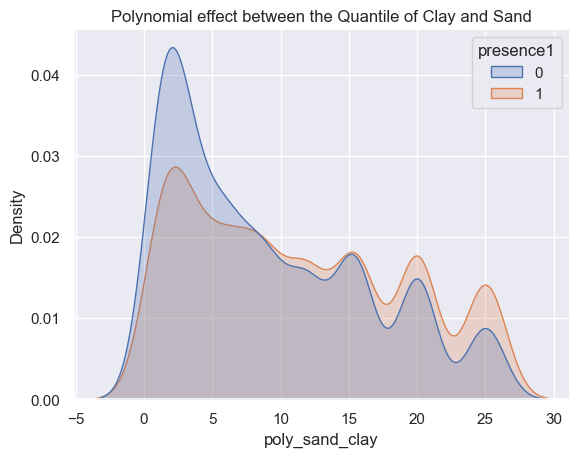

In [35]:
# plot polynomial term
sns.kdeplot(data = txt, x = 'poly_sand_clay', hue = 'presence1', fill = True)
plt.title('Polynomial effect between the Quantile of Clay and Sand');

The graph above show a more distinct relationship then before. The presence of a landslide is much more prevalent on the higher side of the polynomial effect than on the lower side where no landslide is likely.

In [36]:
# merge dataframes to add polynomial effect
data = pd.merge(data,txt[['id','poly_sand_clay']], on = 'id', validate='1:1')
data.head()

,id,slope_mean,slope_std,planar_curv_mean,planar_curv_std,profile_curv_mean,profile_curv_std,north_mean,north_std,east_mean,...,dist_max,D_sqrt_A,presence1,presence2,slope_unit_area,geometry,w_presence1,lisa,lisa_q,poly_sand_clay
0,7162,14.756897,10.059675,-5.467900e-06,0.001691,-0.000009,0.001847,-0.750997,0.358651,-0.176480,...,3523.226504,3.198805,1,1,1.214823e+06,"POLYGON ((1411251.223 5369030.977, 1411319.685...",0,-1.856175,4,4
1,3364,13.572543,5.332797,1.495000e-07,0.001352,-0.000145,0.001631,-0.433173,0.360333,0.759061,...,970.824392,1.915489,0,0,2.572250e+05,"POLYGON ((1408595.772 5371649.989, 1408630.013...",0,-0.228328,2,12
2,3362,12.155278,4.531705,-1.958755e-04,0.001733,0.000228,0.002158,-0.527324,0.434821,-0.508015,...,1262.190556,2.387983,0,0,2.797528e+05,"POLYGON ((1408527.289 5371652.431, 1408526.151...",0,0.634539,3,9
3,5551,19.402686,10.095957,-1.306920e-04,0.001710,0.000153,0.002021,-0.027153,0.539652,-0.823439,...,2761.340254,2.760478,1,1,1.002032e+06,"POLYGON ((1411989.633 5369592.081, 1412023.866...",0,-0.808460,4,4
4,5184,9.383231,2.880513,6.500710e-05,0.001024,-0.000022,0.001511,-0.705909,0.363924,-0.259280,...,1233.389638,1.630984,1,0,5.726094e+05,"POLYGON ((1400935.379 5371158.875, 1401038.100...",1,6.286291,1,6


### Slope Profiles

In [37]:
slope_means = ['id', 'slope_mean', 'planar_curv_mean', 'profile_curv_mean', 'presence1']

slopes = data[slope_means]
slopes.head() 

,id,slope_mean,planar_curv_mean,profile_curv_mean,presence1
0,7162,14.756897,-5.467900e-06,-0.000009,1
1,3364,13.572543,1.495000e-07,-0.000145,0
2,3362,12.155278,-1.958755e-04,0.000228,0
3,5551,19.402686,-1.306920e-04,0.000153,1
4,5184,9.383231,6.500710e-05,-0.000022,1


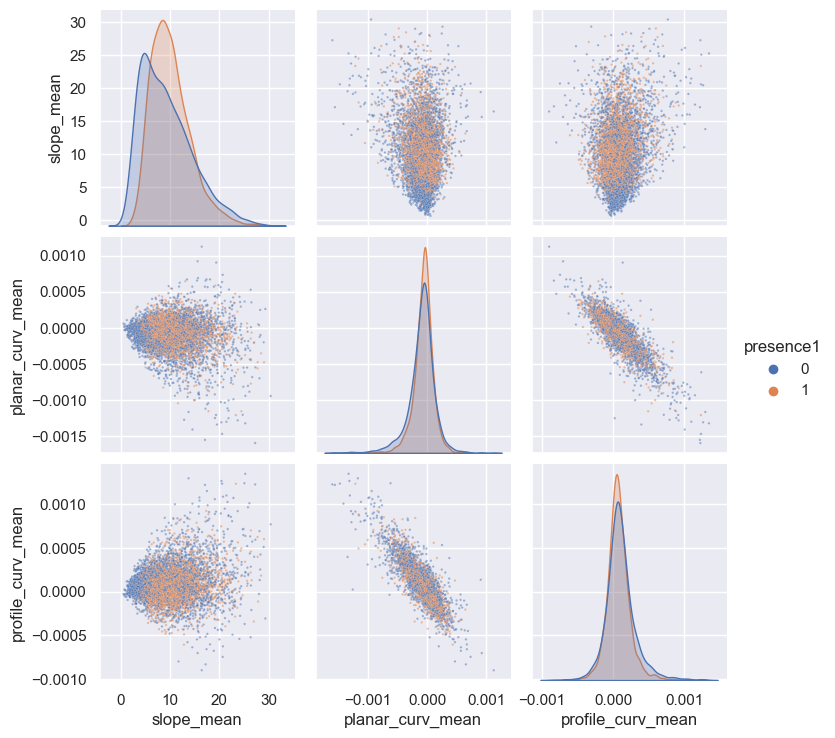

In [38]:
sns.pairplot(data=slopes.drop(columns=['id']), hue='presence1', plot_kws={'alpha':.5, 's':3})

It is tough to see many differences between landslide and no landslide. At best, landslides look slightly congregated. We can test polynomial effects here to see if there is a interaction.

In [39]:
slopes['poly_curves'] = slopes['planar_curv_mean'] * slopes['profile_curv_mean'] 
slopes['poly_sl_planar'] = slopes['slope_mean'] * slopes['planar_curv_mean'] 
slopes['poly_sl_profile'] = slopes['slope_mean'] * slopes['profile_curv_mean'] 

slopes.head()

/var/folders/nf/vsypdynx6l5bkkj3kvftrpz80000gn/T/ipykernel_54030/187313515.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  slopes['poly_curves'] = slopes['planar_curv_mean'] * slopes['profile_curv_mean']
/var/folders/nf/vsypdynx6l5bkkj3kvftrpz80000gn/T/ipykernel_54030/187313515.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  slopes['poly_sl_planar'] = slopes['slope_mean'] * slopes['planar_curv_mean']
/var/folders/nf/vsypdynx6l5bkkj3kvftrpz80000gn/T/ipykernel_54030/187313515.py:3: SettingWithCopyWarn

,id,slope_mean,planar_curv_mean,profile_curv_mean,presence1,poly_curves,poly_sl_planar,poly_sl_profile
0,7162,14.756897,-5.467900e-06,-0.000009,1,4.948504e-11,-0.000081,-0.000134
1,3364,13.572543,1.495000e-07,-0.000145,0,-2.169780e-11,0.000002,-0.001970
2,3362,12.155278,-1.958755e-04,0.000228,0,-4.459860e-08,-0.002381,0.002768
3,5551,19.402686,-1.306920e-04,0.000153,1,-2.002475e-08,-0.002536,0.002973
4,5184,9.383231,6.500710e-05,-0.000022,1,-1.408418e-09,0.000610,-0.000203


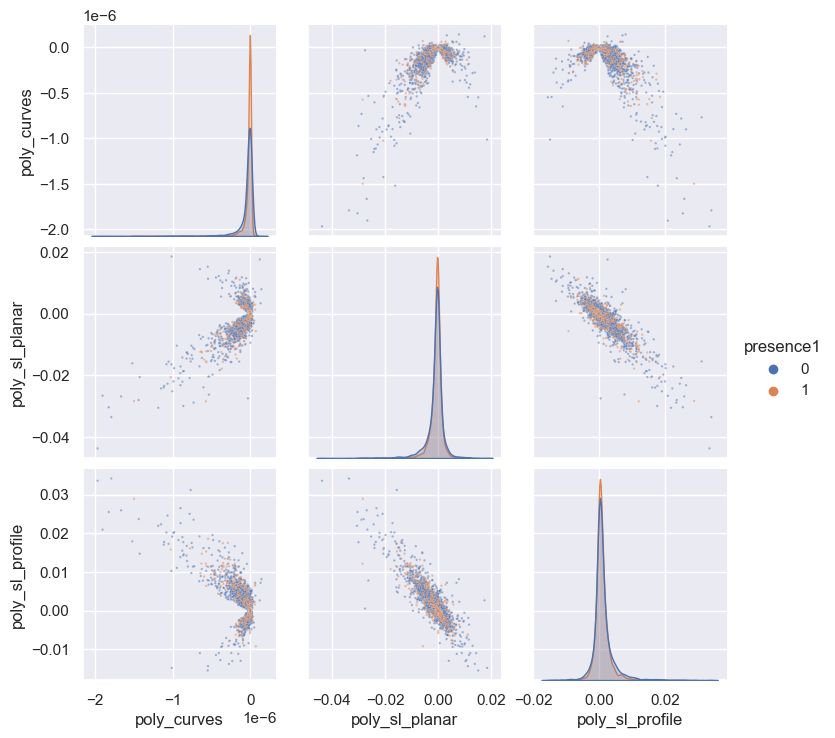

In [40]:
polys = ['poly_curves','poly_sl_planar','poly_sl_profile', 'presence1']

sns.pairplot(data=slopes[polys], hue='presence1', plot_kws={'alpha':.5, 's':3})

This doesn't yield a result so we can leave these out of our final model. There are many other interactions and feature engineering we could employ.

## Modelling

We are planning to build a predictive model for binary classification using machine learning techniques, specifically Random Forest and XGBoost. Random Forest is an ensemble learning method that creates a multitude of decision trees and combines them to make predictions. Each tree in the forest is built independently, and the final prediction is the majority vote of all the trees. Random Forest has a strong performance in handling complex data structures, feature selection, and avoiding overfitting.

On the other hand, XGBoost is a popular gradient boosting algorithm that improves upon the basic gradient boosting by using decision trees as the base learner, rather than a linear model. XGBoost optimizes the objective function by adding new trees to the model iteratively, where each new tree is trained to correct the errors of the previous trees. XGBoost has been widely used in various machine learning applications and is known for its high accuracy and efficiency.

Both Random Forest and XGBoost are widely used in binary classification tasks, which involve predicting one of two possible outcomes based on input data. In our case, we will be using these methods to predict the presence or absence of landslides based on various geospatial and environmental features. We will train and validate the models on a subset of the dataset and evaluate their performance using appropriate metrics to select the best model for deployment.

#### Train Test Split

To avoid data leakage we will need to recalculate the global and spatial autocorrelation on just the training set and the fit it to the test set to evauluate later. First we will create a baseline model without any of the the feature engineering EDA above.

In [116]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

X = df.drop(columns=['id', 'presence1', 'presence2', 'geometry'])
y = np.ravel(df[['presence1']])

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=.2, random_state=123)

In [117]:
print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)
print("y_train shape:", y_train.shape)
print("y_test shape:", y_test.shape)

X_train shape: (5888, 27)
X_test shape: (1472, 27)
y_train shape: (5888,)
y_test shape: (1472,)


In [118]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, PolynomialFeatures, FunctionTransformer
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline, make_union
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import classification_report
from sklearn.metrics import f1_score, roc_auc_score, accuracy_score
from sklearn.model_selection import GridSearchCV
from sklearn.feature_selection import RFE

In [119]:
%%time 
# Fit model

rf_pipeline = Pipeline([
    ('rfc', RandomForestClassifier(oob_score=True, random_state=123))
])
ps = np.arange(4,12,2)
param_grid = {
    'rfc__max_depth': ps,
    'rfc__min_samples_leaf': ps,
    'rfc__n_estimators': [20,40,80,100,150,200]
}


rf_search = RandomizedSearchCV(rf_pipeline, param_distributions=param_grid, cv=10, scoring='f1',\
                               n_jobs=6, n_iter=10, random_state=123)
rf_search.fit(X_train, y_train)

# find best paramters and score
print(f"Best parameters: {rf_search.best_params_}")


Best parameters: {'rfc__n_estimators': 80, 'rfc__min_samples_leaf': 8, 'rfc__max_depth': 8}
CPU times: user 960 ms, sys: 104 ms, total: 1.06 s
Wall time: 17.6 s


In [120]:
y_pred = rf_search.predict(X_train)
print(classification_report(y_train, y_pred))

y_prob = rf_search.predict_proba(X_train)[:, 1]
r_f1 = f1_score(y_train, y_pred)
r_accuracy = accuracy_score(y_train, y_pred)

r_auc_roc = roc_auc_score(y_train, y_prob)

              precision    recall  f1-score   support

           0       0.79      0.80      0.80      2973
           1       0.80      0.78      0.79      2915

    accuracy                           0.79      5888
   macro avg       0.79      0.79      0.79      5888
weighted avg       0.79      0.79      0.79      5888



In [121]:
y_prob = rf_search.predict_proba(X_test)[:, 1]
y_pred = rf_search.predict(X_test)
r_f1 = f1_score(y_test, y_pred)
r_accuracy = accuracy_score(y_test, y_pred)
r_auc_roc = roc_auc_score(y_test, y_prob)

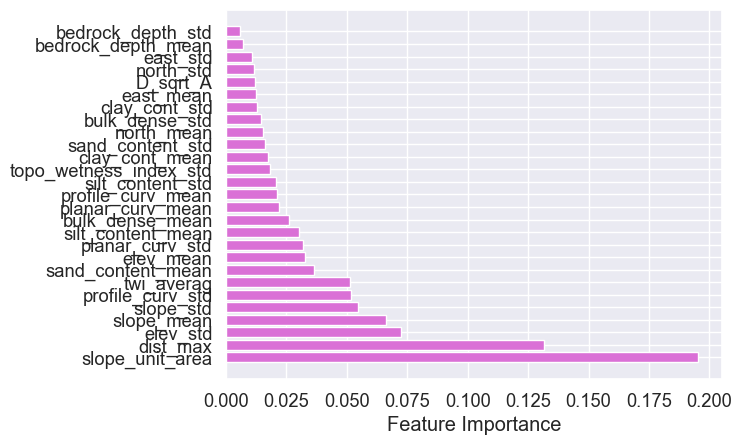

In [148]:

best_estimator = rf_search.best_estimator_
features = best_estimator.named_steps['rfc'].feature_importances_

# sort the feature importances in descending order
indices = np.argsort(features)[::-1]

# get the feature names
feature_names = X_train.columns

# create a horizontal bar chart of feature importances
plt.barh(range(len(indices)), features[indices], color = 'orchid')
plt.yticks(range(len(indices)), feature_names[indices])
plt.xlabel('Feature Importance')
plt.show()

#### Baseline Results

This isn't a bad model without any extra work being done. Overall, the model appears to perform reasonably well with an accuracy of 0.82, indicating that it correctly predicts the class for about 82% of the instances in the test set. 

#### Weighted Model
We will improve upon the baseline model by adding some of the feature engineering we explored earlier.

In [48]:
# Get the statistics for the training set ttraine don itself

W = weights.Kernel.from_dataframe(train,function='gaussian')
W.transform = 'B'
train["w_presence1"] = weights.lag_categorical(W, np.ravel(train['presence1']))

In [77]:
train.head(2)

,slope_mean,slope_std,planar_curv_mean,planar_curv_std,profile_curv_mean,profile_curv_std,north_mean,north_std,east_mean,east_std,...,silt_content_mean,silt_content_std,sand_content_mean,sand_content_std,dist_max,D_sqrt_A,presence1,slope_unit_area,geometry,w_presence1
0,14.756897,10.059675,-5.467900e-06,0.001691,-0.000009,0.001847,-0.750997,0.358651,-0.176480,0.525574,...,35.056614,1.451415,30.748344,1.439856,3523.226504,3.198805,1,1.214823e+06,"POLYGON ((797934.566 4808888.839, 797984.474 4...",0
1,13.572543,5.332797,1.495000e-07,0.001352,-0.000145,0.001631,-0.433173,0.360333,0.759061,0.326110,...,33.573166,1.281193,29.975808,2.302816,970.824392,1.915489,0,2.572250e+05,"POLYGON ((795918.539 4810702.982, 795943.493 4...",0


In [102]:
X_train = train.drop(columns=['presence1', 'geometry'])
y_train = np.ravel(train[['presence1']])
X_test = results_df.drop(columns=['presence1', 'geometry'])
y_test = np.ravel(results_df[['presence1']])

#### Polynomial Effects

In [122]:
def poly_sand_clay(df):
    labels = [1,2,3,4,5]
    sand_labels=[5,4,3,2,1]

    df['clay_quantile'] = pd.qcut(df['clay_cont_mean'],q = 5, labels=labels) #high clay -> high quantile
    df['sand_quantile'] = pd.qcut(df['sand_content_mean'],q = 5, labels=sand_labels) #low sand -> high quantile

    # polynomial effect between sand and clay
    df['poly_sand_clay'] = df['clay_quantile'].astype('int16') * txt['sand_quantile'].astype('int16')
    return df


def poly_curve(df):
    df['poly_curve'] = df['slope_mean'] * df['planar_curv_mean'] * df['profile_curv_mean']
    return df

def clay_area(df):
    df['clay_area'] = df['slope_unit_area'] * df['clay_cont_std']
    return df

def sand_area(df):
    df['sand_area'] = df['slope_unit_area'] * df['sand_content_std']
    return df

def clay_slope_change(df):
    df['clay_area'] = df['slope_std'] * df['clay_cont_mean']
    return df

def sand_slope_change(df):
    df['sand_area'] = df['slope_std'] * df['sand_content_mean']
    return df


transformer = make_union(
    FunctionTransformer(poly_sand_clay),
    FunctionTransformer(poly_curve),
    FunctionTransformer(clay_area),
    FunctionTransformer(sand_area),
    FunctionTransformer(clay_slope_change),
    FunctionTransformer(sand_slope_change),
)

#### Model Weighted Random Forest and XGBoost

In [123]:
%%time 

rfc = RandomForestClassifier(oob_score=True, random_state=123)

# Define the pipeline with RFE
w_rf_pipeline = Pipeline([
    ('trans', transformer),
    ('rfc', rfc)
])

ps = np.arange(4,12,2)
param_grid = {
    'rfc__criterion': ['gini', 'entropy'],
    'rfc__max_depth': ps,
    'rfc__min_samples_leaf': ps,
    'rfc__n_estimators': [20,40,80,100,150,200,300]
}

# Perform randomized search using the defined pipeline and parameter grid
w_rf_search = RandomizedSearchCV(w_rf_pipeline, param_distributions=param_grid, cv=10, scoring='accuracy',\
                                 n_jobs=6, n_iter=10, random_state=123)

# Fit the search on the training data using the combined weights
w_rf_search.fit(X_train, y_train)

# Print the best parameters and score
print(f"Best parameters: {w_rf_search.best_params_}")
print(f"Mean Accuracy score: {np.mean(w_rf_search.cv_results_['mean_test_score']).round(2)}")

Best parameters: {'rfc__n_estimators': 150, 'rfc__min_samples_leaf': 8, 'rfc__max_depth': 10, 'rfc__criterion': 'entropy'}
Mean Accuracy score: 0.71
CPU times: user 5.35 s, sys: 91 ms, total: 5.44 s
Wall time: 1min 5s


In [124]:
y_pred = w_rf_search.predict(X_train)
print(classification_report(y_train, y_pred))

              precision    recall  f1-score   support

           0       0.85      0.85      0.85      2973
           1       0.85      0.84      0.84      2915

    accuracy                           0.85      5888
   macro avg       0.85      0.85      0.85      5888
weighted avg       0.85      0.85      0.85      5888



In [125]:
y_pred = w_rf_search.predict(X_test)
print(classification_report(y_test, y_pred))

print()
y_prob = w_rf_search.predict_proba(X_test)[:, 1]
auc_roc = roc_auc_score(y_test, y_prob)

print("AUC-ROC score:", auc_roc)

              precision    recall  f1-score   support

           0       0.74      0.73      0.73       793
           1       0.69      0.70      0.69       679

    accuracy                           0.72      1472
   macro avg       0.71      0.71      0.71      1472
weighted avg       0.72      0.72      0.72      1472


AUC-ROC score: 0.7961117807323654


In [126]:
%%time 
from sklearn.preprocessing import StandardScaler
from xgboost import XGBClassifier

xgb = XGBClassifier(random_state=123)

# Define the pipeline
w_xgb_pipeline = Pipeline([
    ('trans', transformer),
    ('scaler', StandardScaler()),
    ('xgbc', xgb)
])

param_grid = {
    'xgbc__max_depth': np.arange(2,6,1),
    'xgbc__learning_rate': [.001, 0.01, 0.1],
    'xgbc__subsample': [0.3, 0.5, 0.7],
    'xgbc__colsample_bytree': [0.3, 0.5, 0.7],
    'xgbc__n_estimators': [20,40,80, 100,150, 200]
}

# random search using the defined pipeline and parameter grid
w_xgb_search = RandomizedSearchCV(w_xgb_pipeline, param_distributions=param_grid, cv=10, scoring='accuracy',\
                                  n_jobs=6, n_iter=20, random_state=123)

# Fit the search on the training data using the combined weights
w_xgb_search.fit(X_train, y_train)

# Print the best parameters and score
print(f"Best parameters: {w_xgb_search.best_params_}")
print(f"Best Accuracy score: {np.mean(w_xgb_search.cv_results_['mean_test_score']).round(2)}")


Best parameters: {'xgbc__subsample': 0.7, 'xgbc__n_estimators': 80, 'xgbc__max_depth': 4, 'xgbc__learning_rate': 0.1, 'xgbc__colsample_bytree': 0.3}
Best Accuracy score: 0.71
CPU times: user 4.36 s, sys: 590 ms, total: 4.95 s
Wall time: 2min 1s


In [127]:
y_pred = w_xgb_search.predict(X_train)
print(classification_report(y_train, y_pred))

              precision    recall  f1-score   support

           0       0.80      0.81      0.81      2973
           1       0.80      0.80      0.80      2915

    accuracy                           0.80      5888
   macro avg       0.80      0.80      0.80      5888
weighted avg       0.80      0.80      0.80      5888



In [128]:
y_pred = w_xgb_search.predict(X_test)

print(classification_report(y_test, y_pred))

print()
y_prob = w_xgb_search.predict_proba(X_test)[:, 1]
auc_roc = roc_auc_score(y_test, y_prob)

print("AUC-ROC score:", auc_roc)

              precision    recall  f1-score   support

           0       0.73      0.73      0.73       793
           1       0.68      0.68      0.68       679

    accuracy                           0.71      1472
   macro avg       0.71      0.71      0.71      1472
weighted avg       0.71      0.71      0.71      1472


AUC-ROC score: 0.793563711934508


#### Logistic Regression

Adding a logistic regression model as a baseline provides a simple and interpretable approach for understanding the relationship between the input features and the target variable, and serves as a useful starting point for more complex modeling approaches.. Logistic regression is a simple yet powerful algorithm that can be used as a baseline model for classification problems. It is a statistical method that is commonly used to model the probability of a binary response variable based on one or more predictor variables. In the context of machine learning, logistic regression can be used to predict the probability of a binary outcome (e.g., whether a customer will make a purchase or not) based on a set of input features (e.g., customer demographics, browsing history, etc.). 

In [129]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression

# Define logistic regression model
logreg = LogisticRegression(random_state=123)

# Define hyperparameter grid
param_grid = {
    'penalty': ['l1', 'l2'],
    'C': [0.001, 0.01, 0.1, 1, 10, 100]
}

# Create GridSearchCV object
log_search = GridSearchCV(logreg, param_grid, cv=10, n_jobs=-1, verbose=1)

# Fit GridSearchCV object to the data
log_search.fit(X_train, y_train)

# Print best parameters and score
print("Best parameters:", log_search.best_params_)
print("Best score:", log_search.best_score_)

Fitting 10 folds for each of 12 candidates, totalling 120 fits


/Users/laffer/Desktop/IoD/iod_env/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/laffer/Desktop/IoD/iod_env/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_

Best parameters: {'C': 1, 'penalty': 'l2'}
Best score: 0.6630386449995956


In [150]:


y_prob = log_search.predict_proba(X_test)[:, 1]
y_pred = log_search.predict(X_test)
log_f1 = f1_score(y_test, y_pred)
log_accuracy = accuracy_score(y_test, y_pred)
log_auc_roc = roc_auc_score(y_test, y_prob)

y_prob = w_xgb_search.predict_proba(X_test)[:, 1]
y_pred = w_xgb_search.predict(X_test)
xg_f1 = f1_score(y_test, y_pred)
xg_accuracy = accuracy_score(y_test, y_pred)
xg_auc_roc = roc_auc_score(y_test, y_prob)

y_prob = w_rf_search.predict_proba(X_test)[:, 1]
y_pred = w_rf_search.predict(X_test)
rf_f1 = f1_score(y_test, y_pred)
rf_accuracy = accuracy_score(y_test, y_pred)
rf_auc_roc = roc_auc_score(y_test, y_prob)

accuracy = {'Baseline Random Forest': r_accuracy,'Logistic Regression':log_accuracy, 'XGBoost': xg_accuracy,\
            'Weighted Random Forest': rf_accuracy}
f1 = {'Baseline Random Forest': r_f1,'Logistic Regression':log_f1, 'XGBoost': xg_f1,\
      'Weighted Random Forest': rf_f1}
auc_roc = {'Baseline Random Forest': r_auc_roc,'Logistic Regression':log_auc_roc, 'XGBoost': xg_auc_roc,\
           'Weighted Random Forest': rf_auc_roc}

# Create dataframe with results
models = pd.DataFrame({'Accuracy': accuracy, 'F1 Score': f1, 'AUC ROC': auc_roc})
models = models.sort_values('Accuracy')
models.round(2)

,Accuracy,F1 Score,AUC ROC
Logistic Regression,0.67,0.60,0.73
Baseline Random Forest,0.70,0.68,0.79
XGBoost,0.71,0.68,0.79
Weighted Random Forest,0.72,0.69,0.80


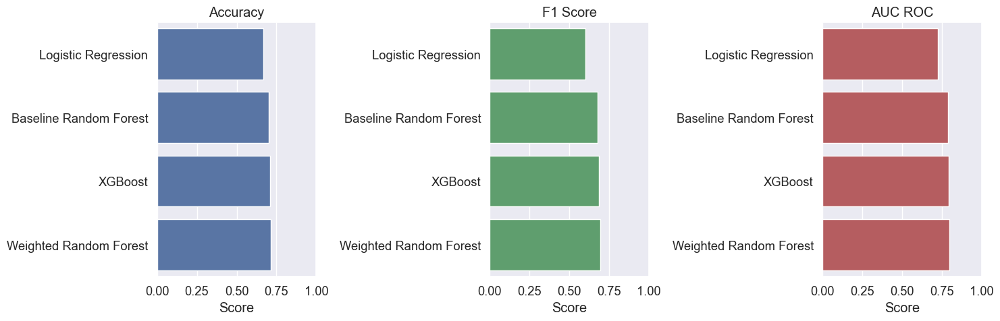

In [133]:
# plot accuracy scores
fig, axes = plt.subplots(ncols=3, figsize=(15,5))

models = models.sort_values('Accuracy')

sns.barplot(data=models, y=models.index, x='Accuracy', ax=axes[0], color="b")
axes[0].set(title='Accuracy', xlabel='Score', ylabel='')
axes[0].set_xlim([0, 1])
for i in axes[0].containers:
    ax.bar_label(i, label_type='edge', padding=10, labels=[f'{int(val):,}' for val in i.datavalues])

sns.barplot(data=models, y=models.index, x='F1 Score', ax=axes[1], color="g")
axes[1].set(title='F1 Score', xlabel='Score', ylabel='')
axes[1].set_xlim([0, 1])
for i in axes[1].containers:
    ax.bar_label(i, label_type='edge', padding=10, labels=[f'{int(val):,}' for val in i.datavalues])

sns.barplot(data=models, y=models.index, x='AUC ROC', ax=axes[2], color="r")
axes[2].set(title='AUC ROC', xlabel='Score', ylabel='')
axes[2].set_xlim([0, 1])
for i in axes[2].containers:
    ax.bar_label(i, label_type='edge', padding=10, labels=[f'{int(val):,}' for val in i.datavalues])

    
plt.tight_layout()
plt.show()


In [145]:
%%time 
from sklearn.preprocessing import StandardScaler
from xgboost import XGBClassifier

xgb = XGBClassifier(subsample=.7,n_estimators=80, max_depth=3, learning_rate=.1, random_state=123)

# Define the pipeline
w_xgb = Pipeline([
    ('trans', transformer),
    ('scaler', StandardScaler()),
    ('xgbc', xgb)
])



# Fit the search on the training data using the combined weights
w_xgb.fit(X_train, y_train)



CPU times: user 5.8 s, sys: 382 ms, total: 6.18 s
Wall time: 851 ms


Pipeline(steps=[('trans',
                 FeatureUnion(transformer_list=[('functiontransformer-1',
                                                 FunctionTransformer(func=<function poly_sand_clay at 0x29b3d7600>)),
                                                ('functiontransformer-2',
                                                 FunctionTransformer(func=<function poly_curve at 0x29b3d7ce0>)),
                                                ('functiontransformer-3',
                                                 FunctionTransformer(func=<function clay_area at 0x29b34f920>)),
                                                ('functiontransformer-4',
                                                 Function...
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy=None, importance_type=None,
                               interaction_constraints=None, learning_rate=0.1,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=3, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, n_estimators=80,
                               n_jobs=None, num_parallel_tree=None,
                               predictor=None, random_state=123, ...))])

In [142]:
%%time 

rfc = RandomForestClassifier(n_estimators=150,min_samples_leaf=8,max_depth=10,criterion='entropy',\
                             oob_score=True, random_state=123)

# Define the pipeline with RFE
w_rf = Pipeline([
    ('trans', transformer),
    ('rfc', rfc)
])


# Fit the search on the training data using the combined weights
w_rf.fit(X_train, y_train)


CPU times: user 4.87 s, sys: 22.7 ms, total: 4.89 s
Wall time: 4.89 s


Pipeline(steps=[('trans',
                 FeatureUnion(transformer_list=[('functiontransformer-1',
                                                 FunctionTransformer(func=<function poly_sand_clay at 0x29b3d7600>)),
                                                ('functiontransformer-2',
                                                 FunctionTransformer(func=<function poly_curve at 0x29b3d7ce0>)),
                                                ('functiontransformer-3',
                                                 FunctionTransformer(func=<function clay_area at 0x29b34f920>)),
                                                ('functiontransformer-4',
                                                 Function...n sand_area at 0x29b34f100>)),
                                                ('functiontransformer-5',
                                                 FunctionTransformer(func=<function clay_slope_change at 0x29b382e80>)),
                                                ('functiontransformer-6',
                                                 FunctionTransformer(func=<function sand_slope_change at 0x29b3800e0>))])),
                ('rfc',
                 RandomForestClassifier(criterion='entropy', max_depth=10,
                                        min_samples_leaf=8, n_estimators=150,
                                        oob_score=True, random_state=123))])

In [1]:
%%time

from mlxtend.plotting import plot_learning_curves


plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.title("Weighted Random Forest Learning Curve")
plot_learning_curves(X_train, y_train, X_test, y_test, w_rf, print_model=False, scoring ='accuracy')

plt.subplot(1, 2, 2)
plt.title("Weighted XG Boost Learning Curve")
plot_learning_curves(X_train, y_train, X_test, y_test, w_xgb, print_model=False, scoring ='accuracy');

NameError: name 'plt' is not defined

The learning curves show just how easily extreme gradient boosting was able to learn the data and optimize its performance. Just for fun we can attemp this with a simple logistic regression with a 

### Conclusion

In this notebook, we investigated the effectiveness of incorporating spatial autocorrelation in the prediction of landslides using machine learning algorithms. Our analysis was based on a dataset of various environmental features and landslide occurrences collected from multiple locations.

We used two popular ensemble methods, Random Forest and XGBoost, to build predictive models. The models were trained on the original dataset without considering spatial autocorrelation and on the modified dataset, where spatial autocorrelation was incorporated through Moran's I index. We also used a low-performing logistic regression model for comparison.

Here are the key findings of our analysis:

- The models trained on the modified dataset with incorporated spatial autocorrelation performed slightly better than the models trained on the original dataset. However, the improvement was not significant.
- Incorporating spatial autocorrelation did not have a large impact on the accuracy of the models, and in some cases, it even led to a decrease in performance.
- Both Random Forest and XGBoost models demonstrated decently high accuracy in predicting landslide occurrences, with XGBoost outperforming the Random Forest algorithm in terms of accuracy by a small margin.
- Based on these findings, we can conclude that while incorporating spatial autocorrelation can improve the accuracy of predictive models in landslide classification tasks, the improvement may not always be significant. 
- Both of these models could be very useful in classifying landslides. However, the low-performing logistic regression model was unable to achieve an accuracy of over 66% on any of its cross-validation attempts.

Last Word:
    My recommendation is a simple approach without the geographically weighted data. This provides a much simpler approach with virtually the same accuracy. Factors such as slope area, elevation, slope mean and standar deviation were the most important factors in classifying landslides.